In [9]:
from sagemaker import get_execution_role
from bs4 import BeautifulSoup 
import pandas as pd
import sagemaker
import boto3
import json
import os

In [10]:
role = get_execution_role()
sess = sagemaker.Session()

In [11]:
bucketName = 'signetringcell'
folderName = 'challenge1-signetringcell-dataset/sig-train-pos/sig-train-pos/'

In [12]:
s3_client = boto3.client('s3')
bucket = s3_client.list_objects(Bucket=bucketName, Prefix=folderName)

In [13]:
# Bucket names for training and validation data

prefix = 'challenge1-signetringcell-dataset/src_detection_model'

train_channel = prefix + '/train'
validation_channel = prefix + '/validation'
train_annotation_channel = prefix + '/train_annotation'
validation_annotation_channel = prefix + '/validation_annotation'


s3_train_data = 's3://{}/{}'.format(bucketName, train_channel)
s3_validation_data = 's3://{}/{}'.format(bucketName, validation_channel)
s3_train_annotation = 's3://{}/{}'.format(bucketName, train_annotation_channel)
s3_validation_annotation = 's3://{}/{}'.format(bucketName, validation_annotation_channel)

In [14]:
# Set up output location where object detection model will be stored
s3_output_location = 's3://{}/{}/output'.format(bucketName, 'challenge1-signetringcell-dataset/src_detection_model')

In [15]:
from sagemaker.amazon.amazon_estimator import get_image_uri

training_image = get_image_uri(sess.boto_region_name, 'object-detection', repo_version="latest")
print (training_image)

The method get_image_uri has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
Defaulting to the only supported framework/algorithm version: 1. Ignoring framework/algorithm version: latest.


811284229777.dkr.ecr.us-east-1.amazonaws.com/object-detection:1


In [16]:
od_model = sagemaker.estimator.Estimator(training_image,
                                         role, 
                                         train_instance_count=1, 
                                         train_instance_type='ml.p3.2xlarge',
                                         train_volume_size = 50,
                                         train_max_run = 360000,
                                         input_mode = 'File',
                                         output_path=s3_output_location,
                                         sagemaker_session=sess)

train_instance_count has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_instance_type has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_max_run has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
train_volume_size has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


In [39]:
# Set our hyperparameters

od_model.set_hyperparameters(base_network='resnet-50',
                             use_pretrained_model=1,
                             num_classes=1,
                             mini_batch_size=8,
                             epochs=80,
                             learning_rate=0.0001,
                             lr_scheduler_step='10',
                             lr_scheduler_factor=0.1,
                             optimizer='sgd',
                             momentum=0.9,
                             weight_decay=0.0005,
                             overlap_threshold=0.5,
                             nms_threshold=0.45,
                             num_training_samples=62,
                             label_width=2000	)

In [40]:
train_data = sagemaker.session.s3_input(s3_train_data, distribution='FullyReplicated', 
                        content_type='image/jpeg', s3_data_type='S3Prefix')
validation_data = sagemaker.session.s3_input(s3_validation_data, distribution='FullyReplicated', 
                             content_type='image/jpeg', s3_data_type='S3Prefix')
train_annotation = sagemaker.session.s3_input(s3_train_annotation, distribution='FullyReplicated', 
                             content_type='image/jpeg', s3_data_type='S3Prefix')
validation_annotation = sagemaker.session.s3_input(s3_validation_annotation, distribution='FullyReplicated', 
                             content_type='image/jpeg', s3_data_type='S3Prefix')

data_channels = {'train': train_data, 'validation': validation_data, 
                 'train_annotation': train_annotation, 'validation_annotation':validation_annotation}

The class sagemaker.session.s3_input has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
The class sagemaker.session.s3_input has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
The class sagemaker.session.s3_input has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.
The class sagemaker.session.s3_input has been renamed in sagemaker>=2.
See: https://sagemaker.readthedocs.io/en/stable/v2.html for details.


In [41]:
od_model.fit(inputs=data_channels, logs=True)

2021-03-05 21:14:21 Starting - Starting the training job...
2021-03-05 21:14:44 Starting - Launching requested ML instancesProfilerReport-1614978860: InProgress
......
2021-03-05 21:15:45 Starting - Preparing the instances for training.........
2021-03-05 21:17:06 Downloading - Downloading input data......
2021-03-05 21:18:15 Training - Training image download completed. Training in progress..Docker entrypoint called with argument(s): train
[03/05/2021 21:18:19 INFO 140224466908992] Reading default configuration from /opt/amazon/lib/python2.7/site-packages/algorithm/default-input.json: {u'label_width': u'350', u'early_stopping_min_epochs': u'10', u'epochs': u'30', u'overlap_threshold': u'0.5', u'lr_scheduler_factor': u'0.1', u'_num_kv_servers': u'auto', u'weight_decay': u'0.0005', u'mini_batch_size': u'32', u'use_pretrained_model': u'0', u'freeze_layer_pattern': u'', u'lr_scheduler_step': u'', u'early_stopping': u'False', u'early_stopping_patience': u'5', u'momentum': u'0.9', u'num_tra

In [43]:
object_detector = od_model.deploy(initial_instance_count = 1,
                                 instance_type = 'ml.m4.xlarge')


-----------------!

In [44]:
import json

results = object_detector.predict(b, initial_args={'ContentType': 'image/jpeg'})

detections = json.loads(results)
#print (detections)

In [45]:
file_name = "2018_69188_1-2_2019-03-14 23_35_35-lv0-38403-61575-2010-2072.jpeg"

with open(file_name, 'rb') as image:
    f = image.read()
    b = bytearray(f)
    ne = open('n.txt','wb')
    ne.write(b)


In [46]:
def visualize_detection(img_file,json_annotations_path, dets, classes=[], thresh=0.2,thresh2=0.4):
        """
        visualize detections in one image
        Parameters:
        ----------
        img : numpy.array
            image, in bgr format
        dets : numpy.array
            ssd detections, numpy.array([[id, score, x1, y1, x2, y2]...])
            each row is one object
        classes : tuple or list of str
            class names
        thresh : float
            score threshold
        """
        import random
        import matplotlib.pyplot as plt
        import matplotlib.image as mpimg

        img=mpimg.imread(img_file)
        image = Image.open(img_file)
        height = img.shape[1]
        width = img.shape[0]
        colors = dict()
        with open(json_annotations_path) as f:
            contents = json.loads(f.read())
            for annotation in contents['annotations']:
                xmin = int(annotation['left'])
                ymin = int(annotation['top']) - int(annotation['height'])
                xmax = int(annotation['left']) + int(annotation['width'])
                ymax = int(annotation['top'])
                draw = ImageDraw.Draw(image)
                draw.rectangle([(xmin, ymin), (xmax, ymax)], outline ='yellow', width=4)
        for det in dets:
            (klass, score, x0, y0, x1, y1) = det
            if score < thresh or score >thresh2:
                continue
            cls_id = int(klass)
            if cls_id not in colors:
                colors[cls_id] = (random.random(), random.random(), random.random())
            xmin = int(x0 * width)
            ymin = int(y0 * height)
            xmax = int(x1 * width)
            ymax = int(y1 * height)
            draw = ImageDraw.Draw(image)
            draw.rectangle([(xmin, ymin), (xmax, ymax)], outline ='blue', width=4)

        return image

In [47]:
from PIL import ImageDraw
from PIL import Image
import json

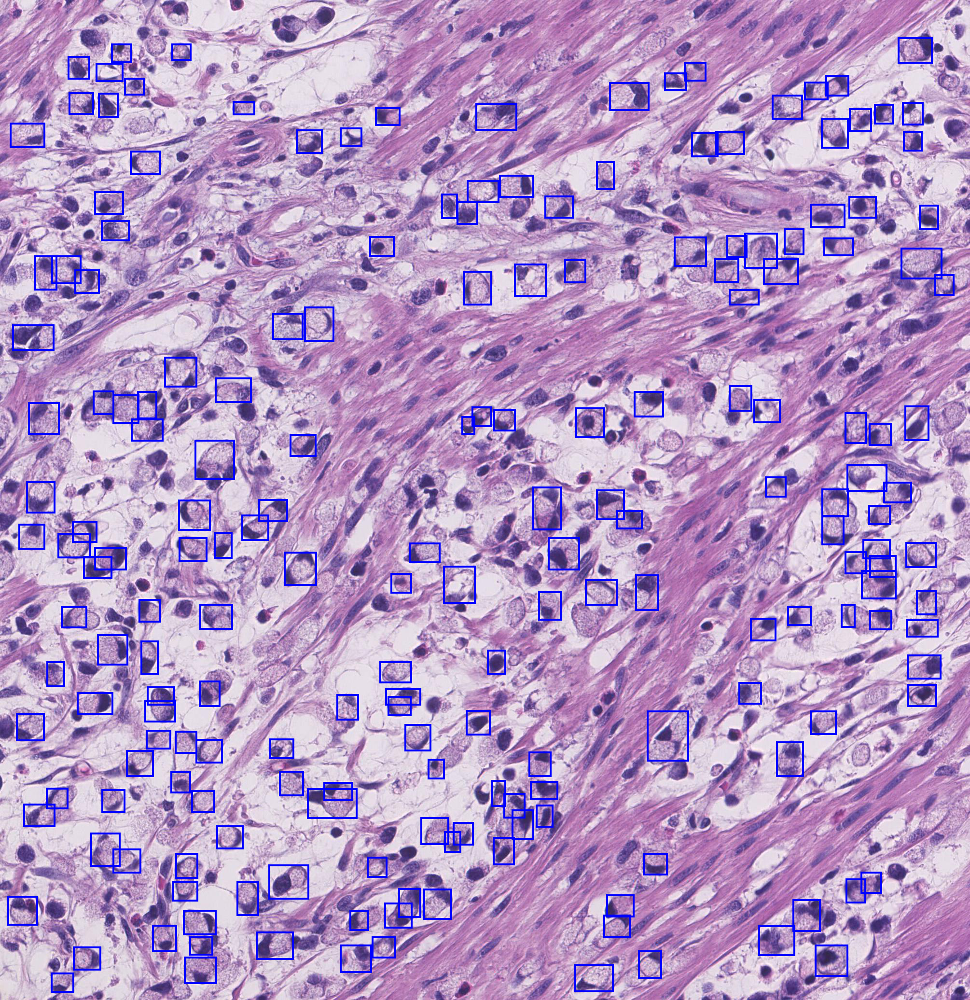

In [48]:
file_name = "2018_69188_1-2_2019-03-14 23_35_35-lv0-38403-61575-2010-2072.jpeg"
json_name ="2018_69188_1-2_2019-03-14 23_35_35-lv0-38403-61575-2010-2072.json"
vis = visualize(file_name, json_name)
vis

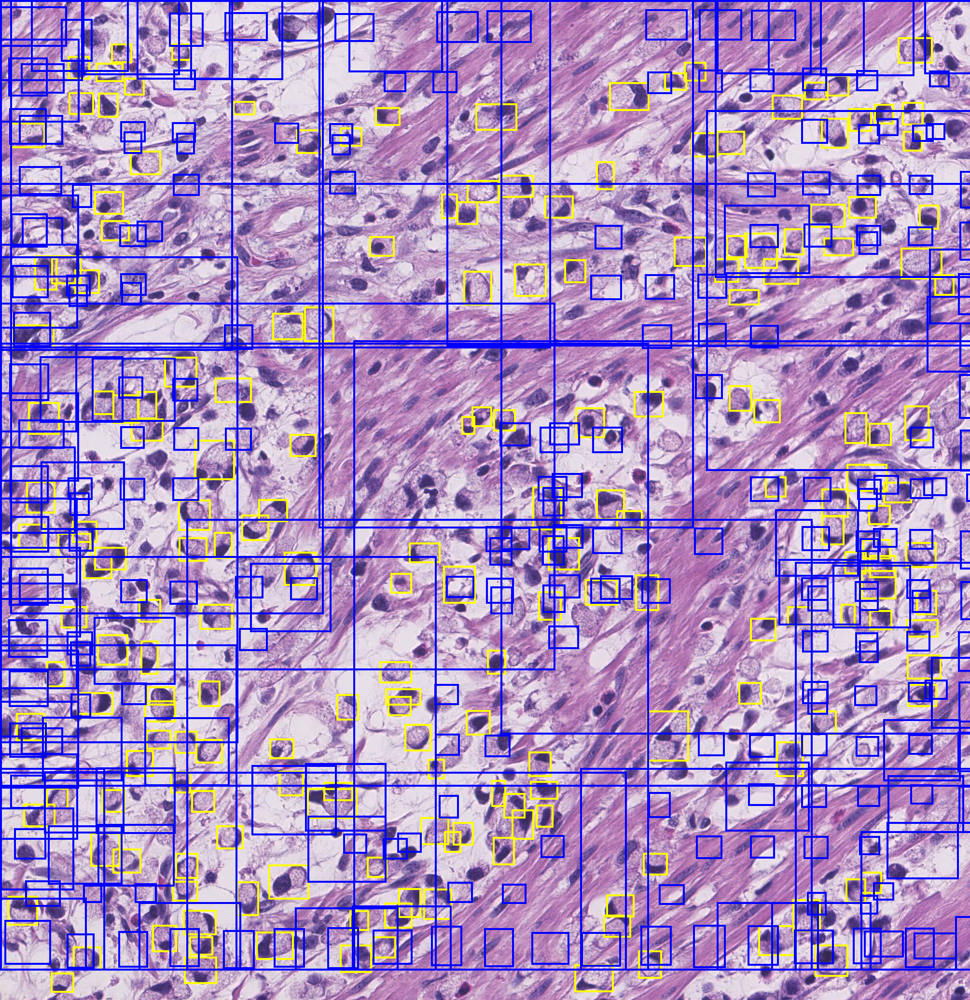

In [56]:
object_categories = ['signet ring cell']
# Setting a threshold 0.20 will only plot detection results that have a confidence score greater than 0.20.
threshold = 0.3
threshold2 = 0.7
# Visualize the detections.
z=visualize_detection(file_name, json_name,detections['prediction'], object_categories, threshold,threshold2,)
z

In [31]:
def visualize(image_path, json_annotations_path):
  image = Image.open(image_path)

  with open(json_annotations_path) as f:
    contents = json.loads(f.read())

  for annotation in contents['annotations']:

    xmin = int(annotation['left'])
    ymin = int(annotation['top']) - int(annotation['height'])
    xmax = int(annotation['left']) + int(annotation['width'])
    ymax = int(annotation['top'])

    draw = ImageDraw.Draw(image)
    draw.rectangle([(xmin, ymin), (xmax, ymax)], outline ='blue', width=4)

  return image